In [ ]:
!pip install torchgeo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.3/605.3 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 855.8/855.8 kB 50.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 821.1/821.1 kB 45.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torchgeo
import matplotlib.pyplot as plt


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
nir_img = r"/content/drive/MyDrive/Colab Notebooks/mastarbeit/in_data/2024350_Mosaik_NIR.tif"
rgb_img = r"/content/drive/MyDrive/Colab Notebooks/mastarbeit/in_data/2024350_Mosaik_RGB.tif"
mask_img = r"/content/drive/MyDrive/Colab Notebooks/mastarbeit/out_data/final_lulc_train_remapped_2.tif"

In [ ]:
from torchgeo.datasets import IntersectionDataset
from torchgeo.datasets import RasterDataset, roi_split
from torchgeo.samplers import RandomGeoSampler
from torch.utils.data import DataLoader
from torchgeo.datasets import RasterDataset, IntersectionDataset, stack_samples




In [ ]:
import torchgeo
from torchgeo.datasets import (
    IntersectionDataset,
    RasterDataset,
    BoundingBox,
    stack_samples
)
from torchgeo.samplers import RandomGeoSampler
from torch.utils.data import DataLoader

# 1. Full Dataset
rgb_data = RasterDataset(paths=rgb_img, crs=31256)
nir_data = RasterDataset(paths=nir_img, crs=31256)
mask_dataset = RasterDataset(paths=mask_img, crs=31256)
mask_dataset.is_image = False
rgb_nir_data = IntersectionDataset(rgb_data, nir_data)
dataset = IntersectionDataset(rgb_nir_data, mask_dataset)

# 2. Full Region of Interest (ROI)
minx = -101193.4376
maxx = -25073.1548
miny = 172175.6434
maxy = 225951.9085
mint, maxt = 0, 0
custom_roi = BoundingBox(minx, maxx, miny, maxy, mint, maxt)

# --- NEW: Splitting the ROI for Train/Val/Test ---

# 1. Define split percentages and patch size/count
train_pct = 0.70
val_pct = 0.15
# test_pct is implicitly 0.15

patch_size = 512
train_samples = 5000 # Number of patches in one epoch
val_samples = 1000
test_samples = 50
# train_samples = 50 # Number of patches in one epoch
# val_samples = 15
# test_samples = 15


# 2. Calculate the spatial split boundaries
# We'll split vertically along the x-axis.
width = custom_roi.maxx - custom_roi.minx
train_val_split_x = custom_roi.minx + width * train_pct
val_test_split_x = train_val_split_x + width * val_pct

# 3. Create three new, non-overlapping BoundingBox objects
train_roi = BoundingBox(
    minx=custom_roi.minx,
    maxx=train_val_split_x,
    miny=custom_roi.miny,
    maxy=custom_roi.maxy,
    mint=mint,
    maxt=maxt
)

val_roi = BoundingBox(
    minx=train_val_split_x,
    maxx=val_test_split_x,
    miny=custom_roi.miny,
    maxy=custom_roi.maxy,
    mint=mint,
    maxt=maxt
)

test_roi = BoundingBox(
    minx=val_test_split_x,
    maxx=custom_roi.maxx,
    miny=custom_roi.miny,
    maxy=custom_roi.maxy,
    mint=mint,
    maxt=maxt
)

print("--- Spatial Split ROIs ---")
print(f"Train ROI: {train_roi}")
print(f"Val ROI:   {val_roi}")
print(f"Test ROI:  {test_roi}")
print("--------------------------\n")


# 4. Create a unique Sampler and DataLoader for each split
# Note: They all use the SAME 'dataset' object, but their 'roi' restricts them.
batch_size = 4

# Training DataLoader
train_sampler = RandomGeoSampler(dataset, size=patch_size, length=train_samples, roi=train_roi)
train_dataloader = DataLoader(dataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples)

# Validation DataLoader
val_sampler = RandomGeoSampler(dataset, size=patch_size, length=val_samples, roi=val_roi)
val_dataloader = DataLoader(dataset, sampler=val_sampler, batch_size=batch_size, collate_fn=stack_samples)

# Testing DataLoader
test_sampler = RandomGeoSampler(dataset, size=patch_size, length=test_samples, roi=test_roi)
test_dataloader = DataLoader(dataset, sampler=test_sampler, batch_size=batch_size, collate_fn=stack_samples)

print("DataLoaders created successfully!")
print(f"Train Dataloader: {len(train_dataloader)} batches of size {batch_size}")
print(f"Val Dataloader:   {len(val_dataloader)} batches of size {batch_size}")
print(f"Test Dataloader:  {len(test_dataloader)} batches of size {batch_size}")

--- Spatial Split ROIs ---
Train ROI: BoundingBox(minx=-101193.4376, maxx=-47909.23964000001, miny=172175.6434, maxy=225951.9085, mint=0, maxt=0)
Val ROI:   BoundingBox(minx=-47909.23964000001, maxx=-36491.19722000001, miny=172175.6434, maxy=225951.9085, mint=0, maxt=0)
Test ROI:  BoundingBox(minx=-36491.19722000001, maxx=-25073.1548, miny=172175.6434, maxy=225951.9085, mint=0, maxt=0)
--------------------------

DataLoaders created successfully!
Train Dataloader: 1250 batches of size 4
Val Dataloader:   250 batches of size 4
Test Dataloader:  13 batches of size 4


In [ ]:
import torch

In [ ]:

# Hardware
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"Using device: {device}")
for i, sample in enumerate(train_dataloader):
    images = sample['image'].to(device).float()
    images = images / 255.0 # Assuming uint8 input, adjust if necessary+
    masks = sample['mask'].to(device) # Shape: [B, 1, H, W]
    if masks.dim() == 4 and masks.shape[1] == 1:
        masks = masks.squeeze(1)
    masks_long = masks.long()

    print(masks.size())
    print(images.size())
    break

Using device: cuda
torch.Size([4, 512, 512])
torch.Size([4, 4, 512, 512])


In [ ]:
import numpy as np
import os

Starting Inference and Visualization...


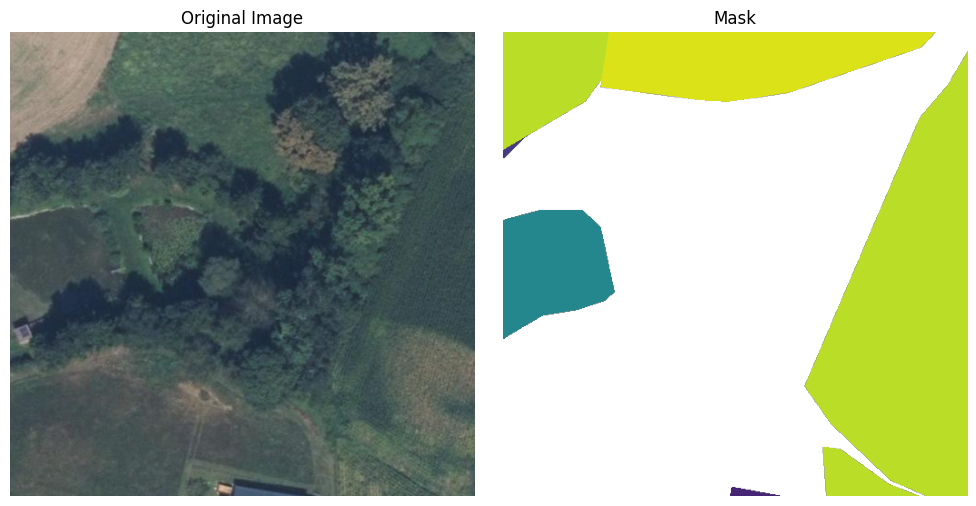

(array([-1,  4,  7, 18, 35, 37]), array([162392,    299,    134,  12946,  65395,  20978]))
colored_mask shape: (512, 512, 4)
img_to_plot shape: (512, 512, 3)


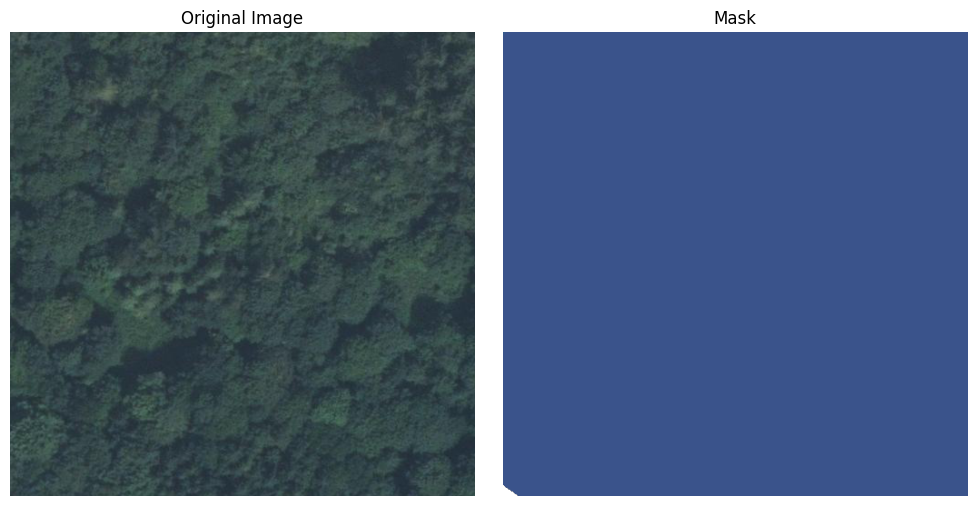

(array([-1, 10, 11]), array([   101, 262031,     12]))
colored_mask shape: (512, 512, 4)
img_to_plot shape: (512, 512, 3)


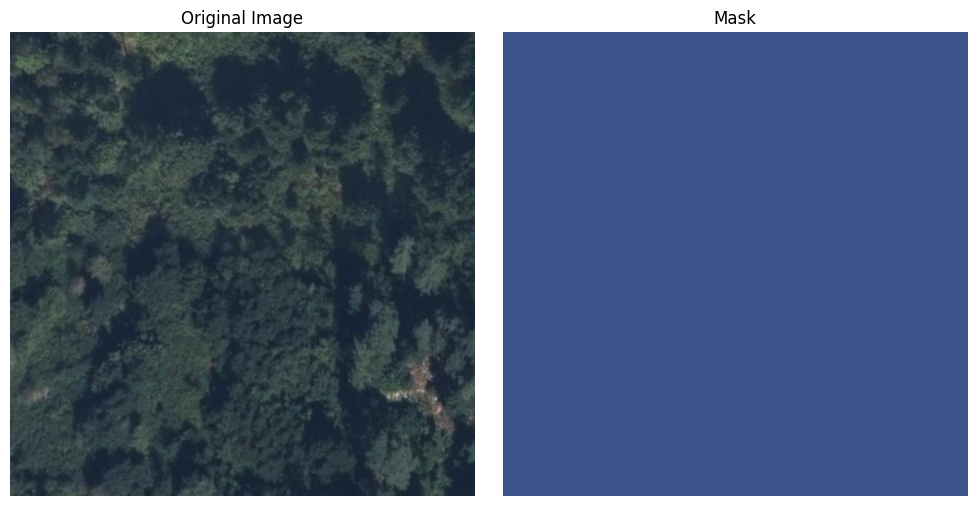

(array([10]), array([262144]))
colored_mask shape: (512, 512, 4)
img_to_plot shape: (512, 512, 3)


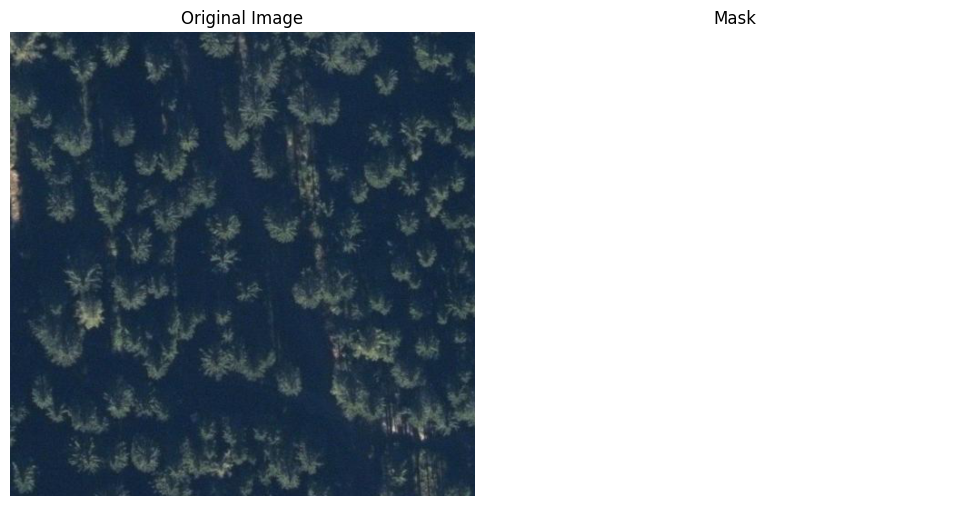

(array([-1]), array([262144]))
colored_mask shape: (512, 512, 4)
img_to_plot shape: (512, 512, 3)


In [ ]:
print("Starting Inference and Visualization...")
num_actual_classes = 40
ignore_index_value = 0
# Define a color map for your classes (adjust colors as needed)
import matplotlib.pyplot as plt
import numpy as np
import torch # Assuming you have torch imported for tensor operations

colors = plt.cm.viridis(np.linspace(0, 1, num_actual_classes))
# Add a color for the ignore index (e.g., black)
ignore_color = [0, 0, 0, 1] # RGBA for black
cmap = np.vstack([colors, ignore_color])

# Assuming 'images' and 'masks_long' are defined earlier in your code
# Example dummy data if not provided for reproducibility:
# images = torch.randn(2, 3, 256, 256) # Batch, Channels, Height, Width
# masks_long = torch.randint(0, num_actual_classes + 1, (2, 256, 256)).long() # Batch, Height, Width

for j in range(images.shape[0]):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the original image
    img_to_plot = images[j].cpu().permute(1, 2, 0).numpy() # Transpose to HWC
    img_to_plot = img_to_plot[:, :, 0:3]
    axes[0].imshow(img_to_plot)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    # Plot the predicted mask with color map
    mask_to_plot = masks_long[j].cpu().numpy() # Move mask to CPU and convert to numpy
    # Create a color image from the indices
    colored_mask = np.zeros((mask_to_plot.shape[0], mask_to_plot.shape[1], 4))
    for class_index in range(num_actual_classes):
        colored_mask[mask_to_plot == class_index] = cmap[class_index]
    colored_mask[mask_to_plot == ignore_index_value] = cmap[-1] # Color for ignore index

    axes[1].imshow(colored_mask)
    axes[1].set_title("Mask")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
    print(np.unique(mask_to_plot, return_counts=True))
    print("colored_mask shape:", colored_mask.shape)
    print("img_to_plot shape:", img_to_plot.shape)

In [ ]:
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader

from torchmetrics.classification import MulticlassJaccardIndex
from tqdm import tqdm
import numpy as np

# --- 1. Configuration & Setup ---
# Assume train_dataloader, val_dataloader, test_dataloader are already created
# using the spatial splitting method from the previous step.

# Hardware
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"Using device: {device}")

# Hyperparameters
learning_rate = 1e-4
num_epochs = 35
batch_size = 4 # Reduced batch size to mitigate CUDA out of memory errors
loss_weight_focal = 2.0
loss_weight_dice = 1.0

# Class Configuration
num_actual_classes = 40
ignore_index_value = -1 # A common choice for ignore_index

# --- 2. Model, Loss, Optimizer, and Metrics ---
# Model
model_path = r"/content/drive/MyDrive/Colab Notebooks/mastarbeit/Model_training/SegFormer/best_model_RGBI_18.pth"
model = smp.Segformer(
    encoder_name="mit_b3",
    encoder_weights="imagenet",
    in_channels=4,
    classes=num_actual_classes, # Model outputs 39 channels, corresponding to classes 0-38
)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.to(device)

# Loss Functions
loss_focal = smp.losses.FocalLoss(mode="multiclass", ignore_index=ignore_index_value, gamma=2.0)
loss_dice = smp.losses.DiceLoss(mode="multiclass", ignore_index=ignore_index_value, from_logits=True)

# Combined Loss Criterion
def combined_loss(pred, target):
    focal = loss_focal(pred, target)
    dice = loss_dice(pred, target)
    return (loss_weight_focal * focal) + (loss_weight_dice * dice)

# Optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

# Metrics (mIoU)
# We use separate metric objects for train and val to keep their states separate.
train_met = MulticlassJaccardIndex(num_classes=num_actual_classes, ignore_index=ignore_index_value).to(device)
val_met = MulticlassJaccardIndex(num_classes=num_actual_classes, ignore_index=ignore_index_value).to(device)


# --- 3. Training & Evaluation Functions ---
def train_one_epoch(model, criterion, optimizer, dataloader, device, metrics, ignore_index_value, num_actual_classes):
    model.train()
    metrics.reset()
    total_loss = 0.0

    for sample in tqdm(dataloader, desc="Training"):
        images = sample['image'].to(device).float()
        masks = sample['mask'].to(device) # Assume masks are already remapped or in the correct format
        # --- FIX: Squeeze the channel dimension from the mask ---
        if masks.dim() == 4 and masks.shape[1] == 1:
            masks = masks.squeeze(1)
        # ---------------------------------------------------------

        # Preprocessing
        images = images / 255.0 # IMPORTANT: Assuming 16-bit data. If 8-bit, use 255.0.


        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks) 

        # Backward pass
        loss.backward()
        optimizer.step()

        # Update metrics and loss
        total_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        # Ensure predictions are also remapped to the metric's expected range if needed
        # (though argmax output should be 0..num_classes-1, which matches the metric)
        metrics.update(preds, masks) # Use the original masks for metrics


    avg_loss = total_loss / len(dataloader)
    iou = metrics.compute()
    return avg_loss, iou

def evaluate(model, criterion, dataloader, device, metrics, ignore_index_value, num_actual_classes):
    model.eval()
    metrics.reset()
    total_loss = 0.0

    with torch.no_grad():
        for sample in tqdm(dataloader, desc="Evaluating"):
            images = sample['image'].to(device).float()
            masks = sample['mask'].to(device) 
            if masks.dim() == 4 and masks.shape[1] == 1:
                masks = masks.squeeze(1)
            images = images / 255.0 

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            metrics.update(preds, masks) 


    avg_loss = total_loss / len(dataloader)
    iou = metrics.compute()
    return avg_loss, iou

Using device: cuda


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/135 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/178M [00:00<?, ?B/s]

In [ ]:
# --- 4. Main Training Loop ---
best_val_miou = 0.0

for epoch in range(num_epochs):
    print(f"--- Epoch {epoch+1}/{num_epochs} ---")
    model_save_path = os.path.join(r"/content/drive/MyDrive/Colab Notebooks/mastarbeit/Model_training/SegFormer/", f"best_model_RGBI_{str(epoch+19)}.pth")

    # Train
    train_loss, train_miou = train_one_epoch(model, combined_loss, optimizer, train_dataloader, device, train_met, ignore_index_value, num_actual_classes)
    print(f"Train -> Loss: {train_loss:.4f}, mIoU: {train_miou:.4f}")

    # Validate
    val_loss, val_miou = evaluate(model, combined_loss, val_dataloader, device, val_met, ignore_index_value, num_actual_classes)
    print(f"Val   -> Loss: {val_loss:.4f}, mIoU: {val_miou:.4f}")

    # Save the best model based on validation mIoU
    if val_miou > best_val_miou:
        best_val_miou = val_miou
        torch.save(model.state_dict(), model_save_path)
        print(f"** New best model saved with mIoU: {best_val_miou:.4f} **\n")
    else:
        print("\n")




--- Epoch 1/35 ---


Training: 100%|██████████| 1250/1250 [41:34<00:00,  2.00s/it]


Train -> Loss: 0.5956, mIoU: 0.2784


Evaluating: 100%|██████████| 250/250 [03:27<00:00,  1.20it/s]


Val   -> Loss: 0.8241, mIoU: 0.1994
** New best model saved with mIoU: 0.1994 **

--- Epoch 2/35 ---


Training: 100%|██████████| 1250/1250 [34:35<00:00,  1.66s/it]


Train -> Loss: nan, mIoU: 0.2876


Evaluating: 100%|██████████| 250/250 [03:19<00:00,  1.25it/s]


Val   -> Loss: 0.7649, mIoU: 0.2037
** New best model saved with mIoU: 0.2037 **

--- Epoch 3/35 ---


Training: 100%|██████████| 1250/1250 [34:29<00:00,  1.66s/it]


Train -> Loss: 0.6131, mIoU: 0.2602


Evaluating: 100%|██████████| 250/250 [03:15<00:00,  1.28it/s]


Val   -> Loss: 0.7657, mIoU: 0.2221
** New best model saved with mIoU: 0.2221 **

--- Epoch 4/35 ---


Training: 100%|██████████| 1250/1250 [34:29<00:00,  1.66s/it]


Train -> Loss: 0.5871, mIoU: 0.2727


Evaluating: 100%|██████████| 250/250 [03:14<00:00,  1.28it/s]


Val   -> Loss: 0.7991, mIoU: 0.2804
** New best model saved with mIoU: 0.2804 **

--- Epoch 5/35 ---


Training: 100%|██████████| 1250/1250 [34:20<00:00,  1.65s/it]


Train -> Loss: 0.5992, mIoU: 0.2588


Evaluating: 100%|██████████| 250/250 [03:15<00:00,  1.28it/s]


Val   -> Loss: 0.7190, mIoU: 0.2361


--- Epoch 6/35 ---


Training: 100%|██████████| 1250/1250 [34:21<00:00,  1.65s/it]


Train -> Loss: 0.5885, mIoU: 0.3088


Evaluating: 100%|██████████| 250/250 [03:14<00:00,  1.29it/s]


Val   -> Loss: 0.7118, mIoU: 0.2237


--- Epoch 7/35 ---


Training: 100%|██████████| 1250/1250 [34:16<00:00,  1.65s/it]


Train -> Loss: 0.5740, mIoU: 0.2929


Evaluating: 100%|██████████| 250/250 [03:15<00:00,  1.28it/s]


Val   -> Loss: 0.7638, mIoU: 0.2526


--- Epoch 8/35 ---


Training: 100%|██████████| 1250/1250 [34:27<00:00,  1.65s/it]


Train -> Loss: 0.5856, mIoU: 0.2751


Evaluating: 100%|██████████| 250/250 [03:14<00:00,  1.28it/s]


Val   -> Loss: 0.8505, mIoU: 0.2517


--- Epoch 9/35 ---


Training: 100%|█████████▉| 1248/1250 [34:12<00:03,  1.66s/it]

Starting Visualization of Preprocessed Data...


Evaluating:   0%|          | 0/13 [00:00<?, ?it/s]

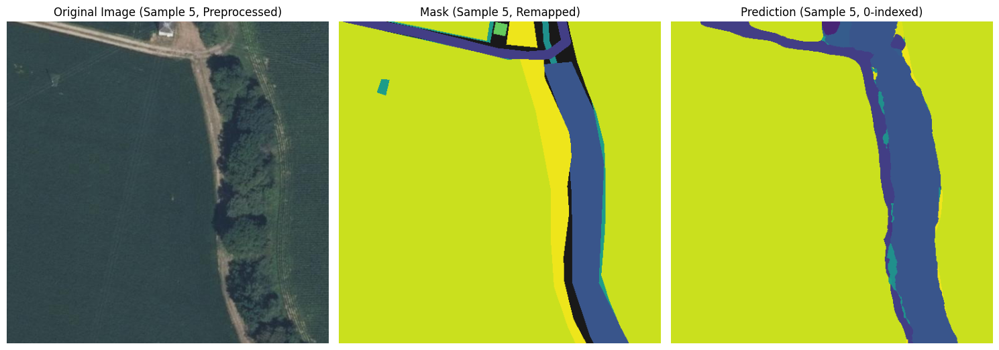

Sample 5:
  Unique values in original mask: [-1  7 10 19 21 29 35 37]
  Counts of unique values in original mask: [  6742   5422  21828    532   2370    375 210344  14531]
  Unique values in remapped mask: [-1  7 10 19 21 29 35 37]
  Counts of unique values in remapped mask: [  6742   5422  21828    532   2370    375 210344  14531]
  Unique values in pred: [ 4  6  7 10 11 19 21 35 36 37]
  Counts of unique pred values: [   494    122  10235  34885   1267   1362    100 212535    345    799]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


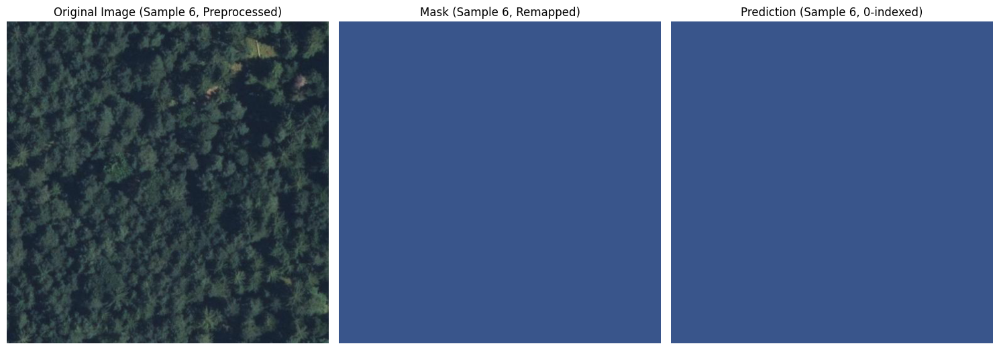

Sample 6:
  Unique values in original mask: [10]
  Counts of unique values in original mask: [262144]
  Unique values in remapped mask: [10]
  Counts of unique values in remapped mask: [262144]
  Unique values in pred: [10]
  Counts of unique pred values: [262144]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


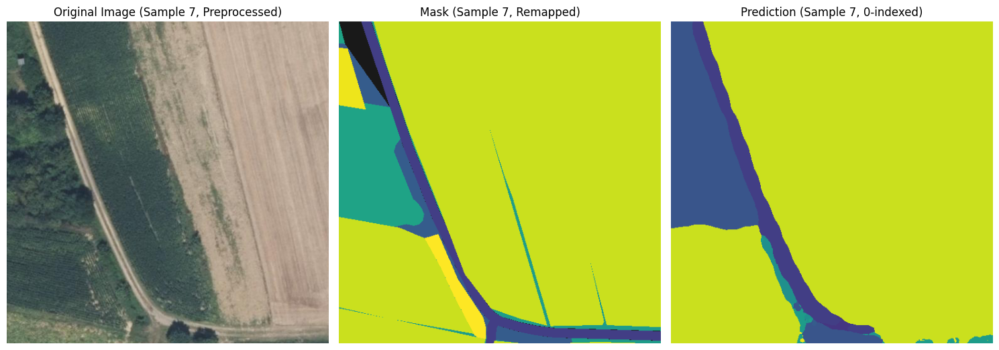

Sample 7:
  Unique values in original mask: [-1  7 11 21 22 35 37 38]
  Counts of unique values in original mask: [  3457  11851   7121   4415  19410 209548   2642   3700]
  Unique values in remapped mask: [-1  7 11 21 22 35 37 38]
  Counts of unique values in remapped mask: [  3457  11851   7121   4415  19410 209548   2642   3700]
  Unique values in pred: [ 6  7 10 11 19 21 35 36 37]
  Counts of unique pred values: [   416  12329  31205     59   1459   1280 215315      2     79]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


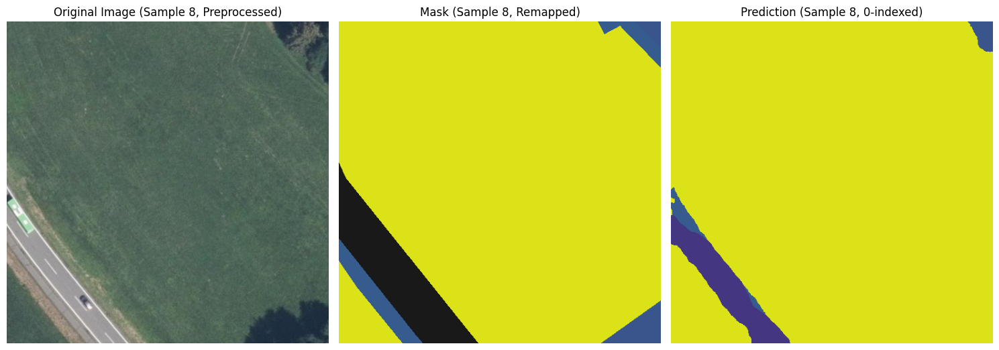

Evaluating:   8%|▊         | 1/13 [00:26<05:18, 26.56s/it]

Sample 8:
  Unique values in original mask: [-1 10 11 36]
  Counts of unique values in original mask: [ 19670   3942   7077 231455]
  Unique values in remapped mask: [-1 10 11 36]
  Counts of unique values in remapped mask: [ 19670   3942   7077 231455]
  Unique values in pred: [ 5  6 10 11 36]
  Counts of unique pred values: [    12   9983   1311   1613 249225]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


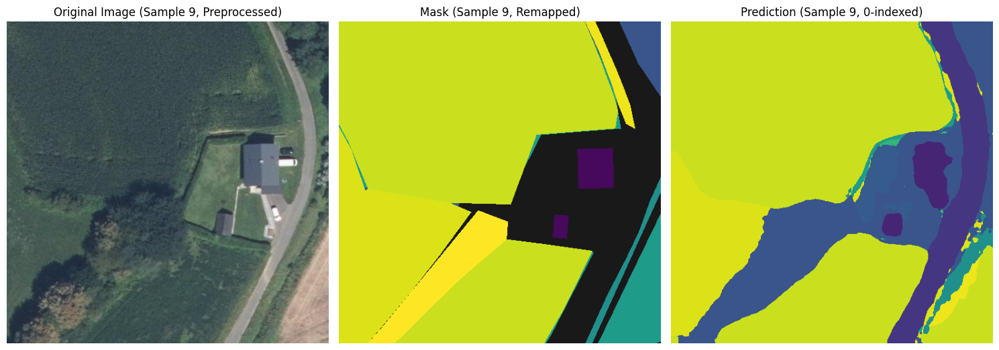

Sample 9:
  Unique values in original mask: [-1  1  5 10 11 19 21 35 36 37 38]
  Counts of unique values in original mask: [ 55148   4433     47   4377     59   2377  11604 133970  34932   2744
  12453]
  Unique values in remapped mask: [-1  1  5 10 11 19 21 35 36 37 38]
  Counts of unique values in remapped mask: [ 55148   4433     47   4377     59   2377  11604 133970  34932   2744
  12453]
  Unique values in pred: [ 4  6 10 11 19 21 25 35 36 37]
  Counts of unique pred values: [  5726  22269  45219   5452   3398   1637    287 149551  26716   1889]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


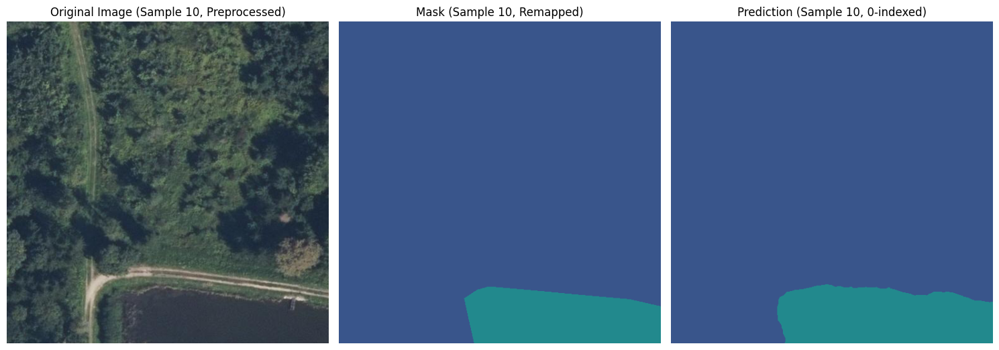

Sample 10:
  Unique values in original mask: [10 18]
  Counts of unique values in original mask: [238272  23872]
  Unique values in remapped mask: [10 18]
  Counts of unique values in remapped mask: [238272  23872]
  Unique values in pred: [10 18]
  Counts of unique pred values: [234185  27959]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


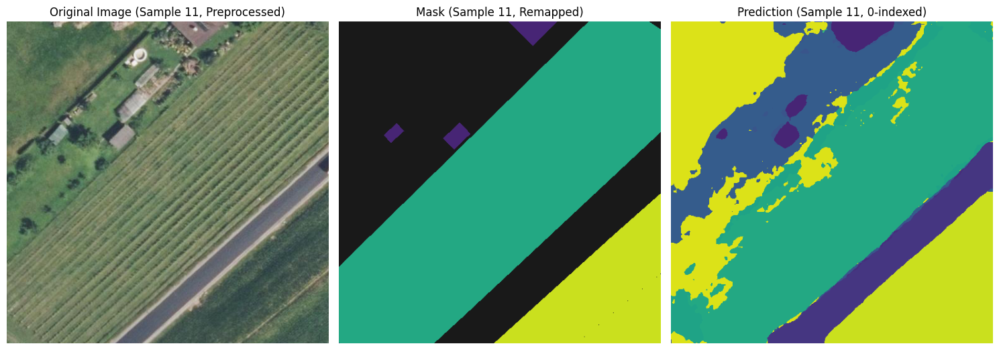

Sample 11:
  Unique values in original mask: [-1  4  7 23 35]
  Counts of unique values in original mask: [103323   2922      1 124057  31841]
  Unique values in remapped mask: [-1  4  7 23 35]
  Counts of unique values in remapped mask: [103323   2922      1 124057  31841]
  Unique values in pred: [ 4  5  6 10 11 22 23 25 35 36]
  Counts of unique pred values: [ 5297   343 21391  1520 38017 12023 96107    17 34969 52460]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


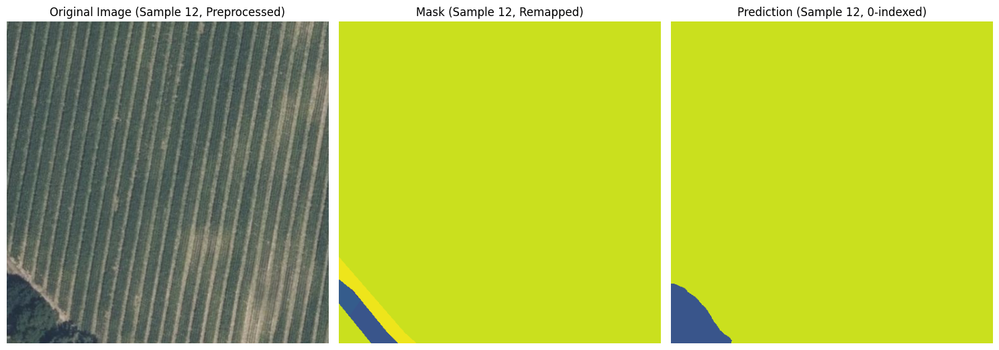

Evaluating:  15%|█▌        | 2/13 [00:45<04:01, 21.99s/it]

Sample 12:
  Unique values in original mask: [ 7 10 11 35 37]
  Counts of unique values in original mask: [    29   2249   1106 255520   3240]
  Unique values in remapped mask: [ 7 10 11 35 37]
  Counts of unique values in remapped mask: [    29   2249   1106 255520   3240]
  Unique values in pred: [10 35]
  Counts of unique pred values: [  5559 256585]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


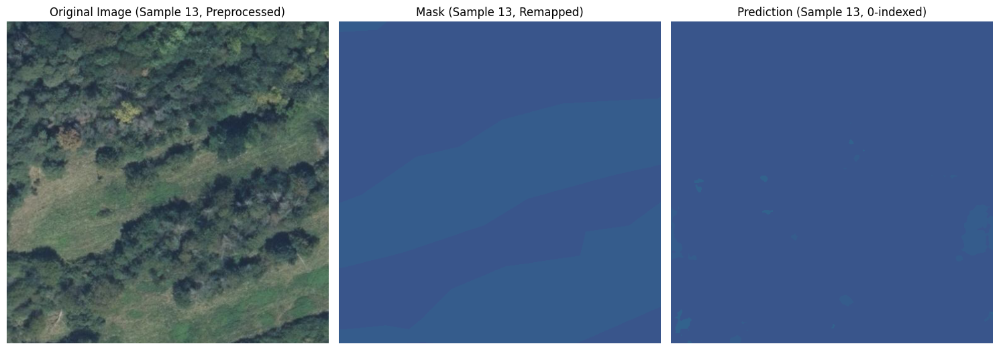

Sample 13:
  Unique values in original mask: [10 11]
  Counts of unique values in original mask: [142965 119179]
  Unique values in remapped mask: [10 11]
  Counts of unique values in remapped mask: [142965 119179]
  Unique values in pred: [10 11 12]
  Counts of unique pred values: [256787   4492    865]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


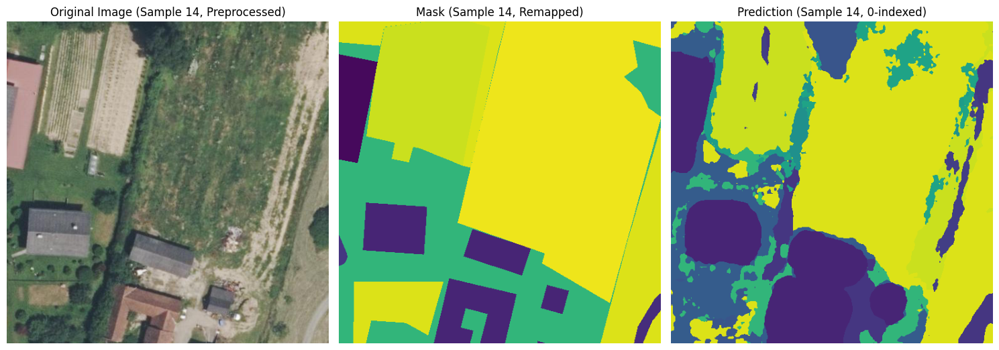

Sample 14:
  Unique values in original mask: [ 1  4  5  6 25 35 36 37]
  Counts of unique values in original mask: [ 7707 22091  1265   413 65026 33961 32541 99140]
  Unique values in remapped mask: [ 1  4  5  6 25 35 36 37]
  Counts of unique values in remapped mask: [ 7707 22091  1265   413 65026 33961 32541 99140]
  Unique values in pred: [ 4  6  7 10 11 19 21 22 25 35 36]
  Counts of unique pred values: [ 44995  11989   4289   7583  27843   2487   2494   8066  13500  37094
 101804]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


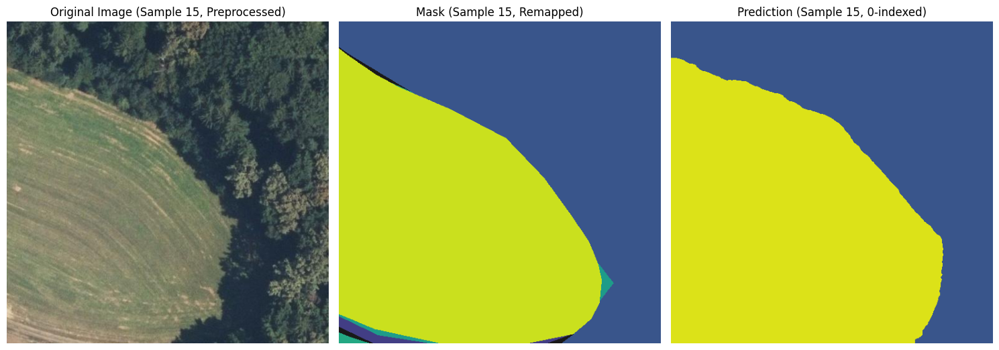

Sample 15:
  Unique values in original mask: [-1  7 10 21 23 35]
  Counts of unique values in original mask: [   954   1755 122568   1475    405 134987]
  Unique values in remapped mask: [-1  7 10 21 23 35]
  Counts of unique values in remapped mask: [   954   1755 122568   1475    405 134987]
  Unique values in pred: [10 36]
  Counts of unique pred values: [113221 148923]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


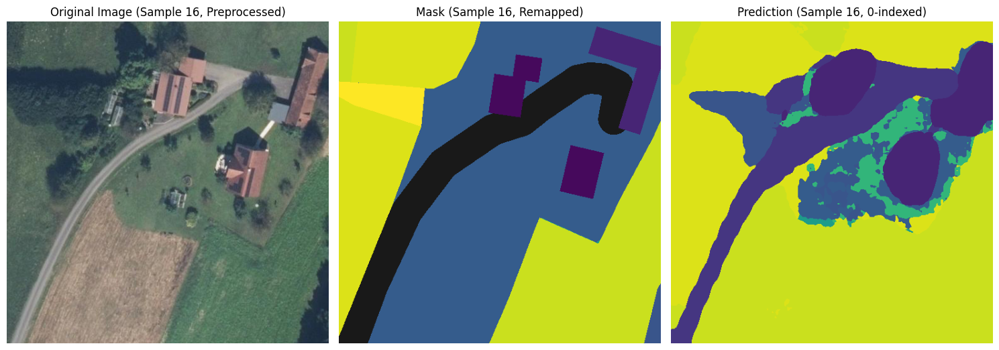

Evaluating:  23%|██▎       | 3/13 [01:06<03:34, 21.42s/it]

Sample 16:
  Unique values in original mask: [-1  1  4 10 11 21 35 36 38]
  Counts of unique values in original mask: [ 33589   8877   8662   1413 108706     68  51033  43643   6153]
  Unique values in remapped mask: [-1  1  4 10 11 21 35 36 38]
  Counts of unique values in remapped mask: [ 33589   8877   8662   1413 108706     68  51033  43643   6153]
  Unique values in pred: [ 4  6 10 11 21 25 35 36]
  Counts of unique pred values: [ 26140  30679  11762  14409    627  10998 102369  65160]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


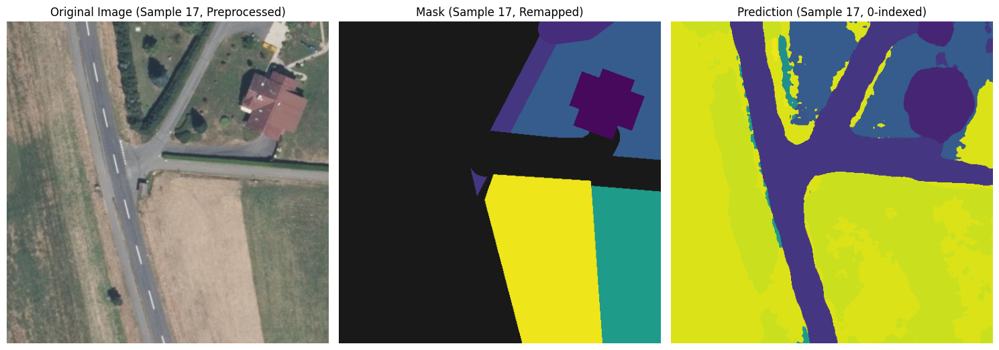

Sample 17:
  Unique values in original mask: [-1  1  5  6 11 21 37]
  Counts of unique values in original mask: [152880   8910   3277   5282  26909  25009  39877]
  Unique values in remapped mask: [-1  1  5  6 11 21 37]
  Counts of unique values in remapped mask: [152880   8910   3277   5282  26909  25009  39877]
  Unique values in pred: [ 4  6 10 11 19 21 35 36 37]
  Counts of unique pred values: [12178 53498   677 29511  1413  1050 67677 95795   345]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


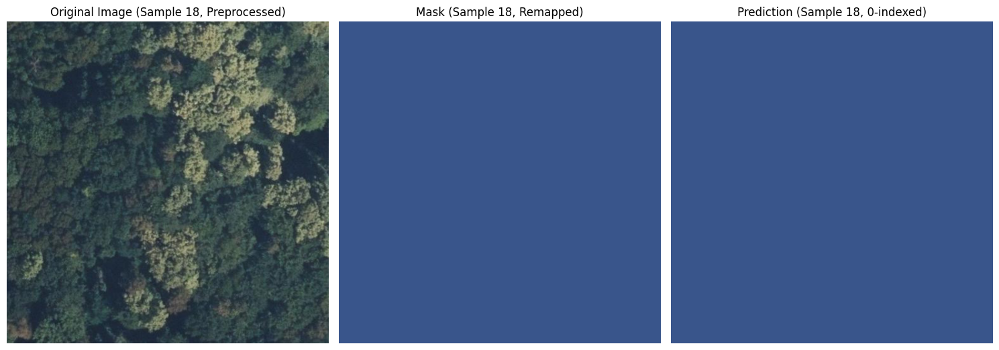

Sample 18:
  Unique values in original mask: [10]
  Counts of unique values in original mask: [262144]
  Unique values in remapped mask: [10]
  Counts of unique values in remapped mask: [262144]
  Unique values in pred: [10]
  Counts of unique pred values: [262144]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


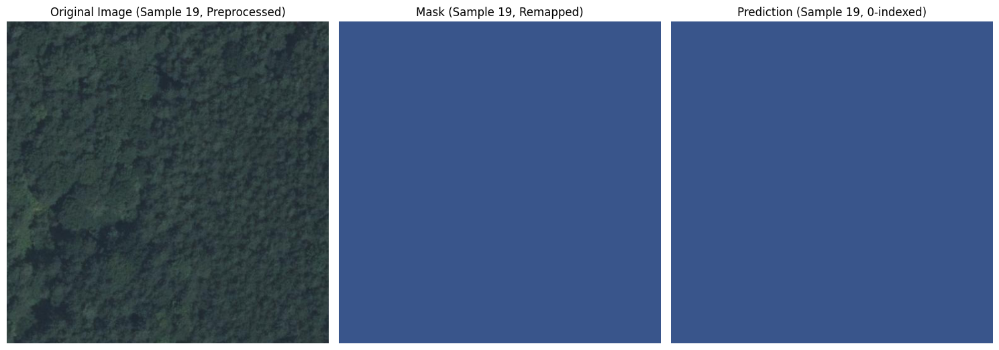

Sample 19:
  Unique values in original mask: [10]
  Counts of unique values in original mask: [262144]
  Unique values in remapped mask: [10]
  Counts of unique values in remapped mask: [262144]
  Unique values in pred: [10]
  Counts of unique pred values: [262144]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


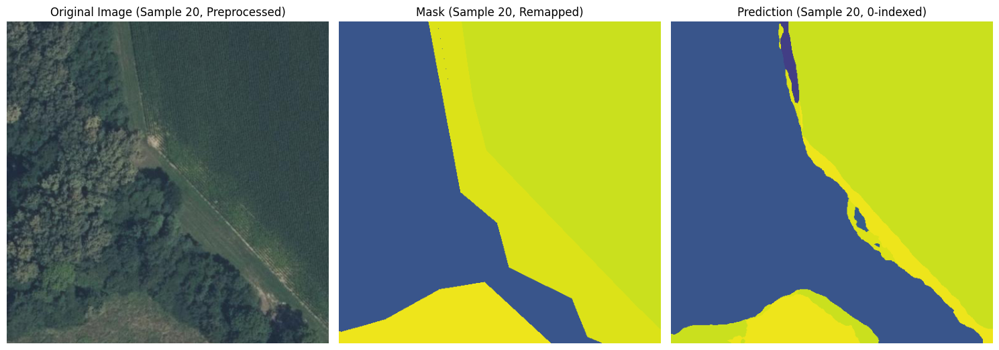

Evaluating:  31%|███       | 4/13 [01:28<03:16, 21.86s/it]

Sample 20:
  Unique values in original mask: [10 35 36 37]
  Counts of unique values in original mask: [ 99200 101380  42434  19130]
  Unique values in remapped mask: [10 35 36 37]
  Counts of unique values in remapped mask: [ 99200 101380  42434  19130]
  Unique values in pred: [ 7 10 11 35 36 37]
  Counts of unique pred values: [  1724 128474    470 111102   2458  17916]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


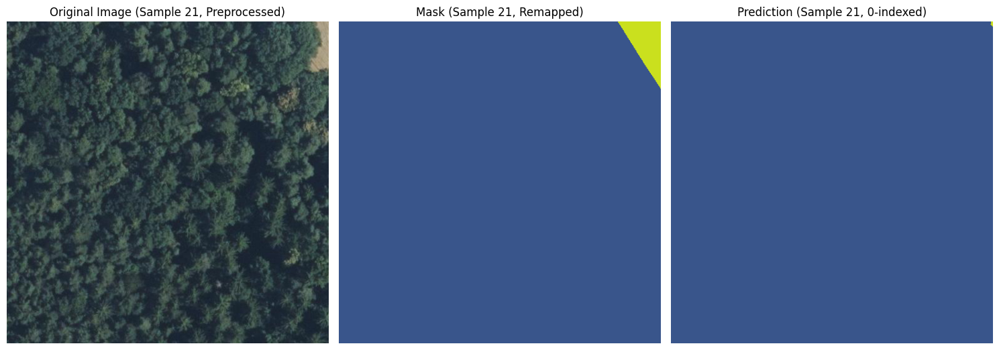

Sample 21:
  Unique values in original mask: [10 35]
  Counts of unique values in original mask: [258423   3721]
  Unique values in remapped mask: [10 35]
  Counts of unique values in remapped mask: [258423   3721]
  Unique values in pred: [10 35]
  Counts of unique pred values: [262122     22]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


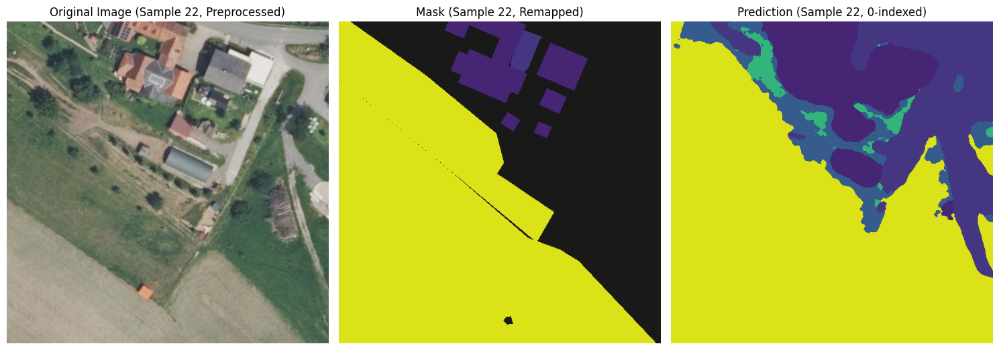

Sample 22:
  Unique values in original mask: [-1  4  6 36]
  Counts of unique values in original mask: [102002  15063   1843 143236]
  Unique values in remapped mask: [-1  4  6 36]
  Counts of unique values in remapped mask: [102002  15063   1843 143236]
  Unique values in pred: [ 4  6 11 25 36]
  Counts of unique pred values: [ 33207  42669  18945   5374 161949]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


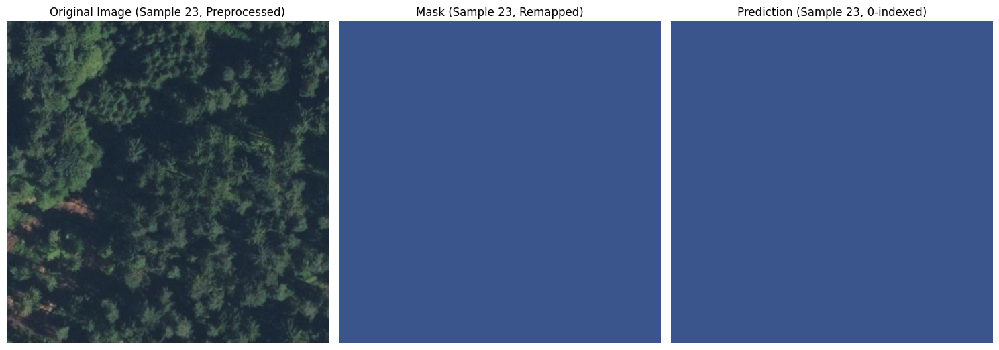

Sample 23:
  Unique values in original mask: [10]
  Counts of unique values in original mask: [262144]
  Unique values in remapped mask: [10]
  Counts of unique values in remapped mask: [262144]
  Unique values in pred: [10]
  Counts of unique pred values: [262144]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------


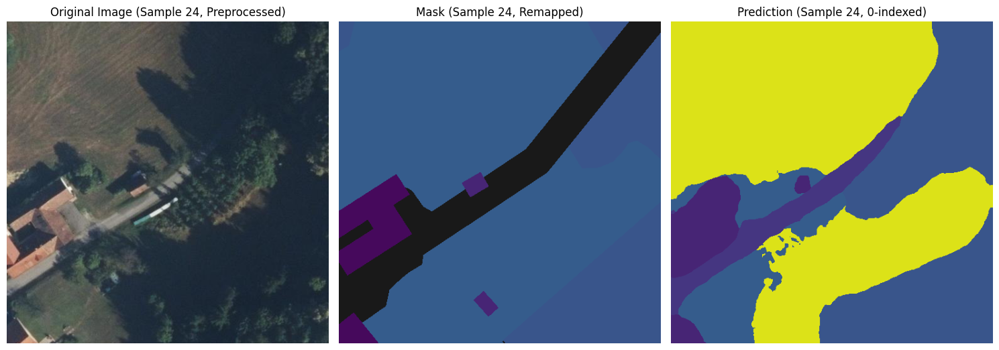

Evaluating:  31%|███       | 4/13 [01:51<04:11, 27.91s/it]

Sample 24:
  Unique values in original mask: [-1  1  4 10 11]
  Counts of unique values in original mask: [ 37304  12070   1700  47044 164026]
  Unique values in remapped mask: [-1  1  4 10 11]
  Counts of unique values in remapped mask: [ 37304  12070   1700  47044 164026]
  Unique values in pred: [ 4  6 10 11 36]
  Counts of unique pred values: [ 14622  13898  70845  24045 138734]
  Preprocessed Image shape: (512, 512, 3)
  Remapped Mask shape: (512, 512)
------------------------------
Visualization complete.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# --- Re-using Configuration & Setup from your training code ---
# Ensure these variables and the remap_masks function are defined in your environment,
# or provide dummy values for standalone testing.
# For example, if you don't have train_dataloader available directly for this script:
# from torch.utils.data import Dataset, DataLoader
# class DummyDataset(Dataset):
#     def __init__(self, num_samples=5, img_size=256, num_classes=40):
#         self.num_samples = num_samples
#         self.img_size = img_size
#         self.num_classes = num_classes
#
#     def __len__(self):
#         return self.num_samples
#
#     def __getitem__(self, idx):
#         # Simulate 16-bit image data (0-65535)
#         image = torch.randint(0, 65536, (4, self.img_size, self.img_size), dtype=torch.float32)
#         # Simulate original masks with NoData=0 and classes 1-39
#         mask = torch.randint(0, self.num_classes, (1, self.img_size, self.img_size), dtype=torch.long)
#         # Introduce some NoData values
#         if idx % 2 == 0:
#             mask[0, :self.img_size//4, :self.img_size//4] = 0
#         return {'image': image, 'mask': mask}
#
# # Example usage for visualization if dataloaders aren't directly accessible:
# # Assume num_actual_classes = 39, ignore_index_value = -1, remapping_dict is defined as in e502ad4b
# # dummy_dataset = DummyDataset(num_samples=5, num_classes=40) # Original mask values 0-39
# # train_dataloader = DataLoader(dummy_dataset, batch_size=2, shuffle=False)
# # device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Re-using values from cell e502ad4b
num_actual_classes = 39 # Model outputs 39 classes (0-38)
ignore_index_value = -1 # Ignore value
# Remapping dict for masks: -1 -> -1, 0 -> 0, 1-38 -> 1-38, 39 -> -1
print("Starting Visualization of Preprocessed Data...")

# Define a color map for your remapped classes (0 to num_actual_classes-1)
# Make sure this has enough colors for your 'num_actual_classes' (39)
colors = plt.cm.viridis(np.linspace(0, 1, num_actual_classes))
# Add a distinct color for the ignore index (-1)
ignore_color = [0.1, 0.1, 0.1, 1] # RGBA for dark gray
# Combine colors for actual classes and the ignore index
# The ignore_color will be at the end of this custom colormap, corresponding to index `num_actual_classes` (39)
custom_cmap_list = list(colors) + [ignore_color]
custom_cmap = plt.matplotlib.colors.ListedColormap(custom_cmap_list)

# Get a batch of data from your training dataloader
# It's important to use train_dataloader here because you want to see
# what the training loop will actually process.
# You might want to grab only a few samples to visualize
num_samples_to_visualize = 5 # Adjust as needed
i = 0
with torch.no_grad():
    # Use test_dataloader for visualization after potential training
    for sample in tqdm(test_dataloader, desc="Evaluating"):
        i += 1
        images = sample['image'].to(device).float()
        masks = sample['mask'].to(device) # Original masks (-1, 0-39)

        # --- Squeeze the channel dimension from the mask if present ---
        if masks.dim() == 4 and masks.shape[1] == 1:
            masks = masks.squeeze(1)
        # ---------------------------------------------------------

        # Preprocessing
        images_preprocessed = images / 255.0 # Adjust for your data type

        # --- Apply remapping logic to the masks ---
        # remapped_masks = remap_masks(masks, remapping_dict, ignore_index_value)
        # ---------------------------------------------------------

        # Get predictions from the model
        outputs = model(images_preprocessed) # Use preprocessed images for inference
        # --- Remove +1 from predictions ---
        preds = torch.argmax(outputs, dim=1)  # Predictions are 0-38
        # ---------------------------------------------------------


        if i <= num_samples_to_visualize:
            # Now, visualize for each item in the batch
            for j in range(images_preprocessed.shape[0]):
                fig, axes = plt.subplots(1, 3, figsize=(15, 7)) # Increased figure size

                # Plot the original image (preprocessed version)
                # Assuming images are C, H, W and we want to show the first 3 channels (RGB)
                img_to_plot = images_preprocessed[j].cpu().permute(1, 2, 0).numpy()
                # Ensure image is clipped to [0,1] for display after scaling (assuming 0-255 scaling)
                img_to_plot = np.clip(img_to_plot[:, :, :3], 0, 1)
                axes[0].imshow(img_to_plot)
                axes[0].set_title(f"Original Image (Sample {i*batch_size + j + 1}, Preprocessed)")
                axes[0].axis('off')

                # Plot the remapped ground truth mask
                mask_to_plot = masks[j].cpu().numpy()

                # For visualization, we need to map the ignore_index_value (-1) to the last index of the colormap.
                # Valid class indices are 0 to num_actual_classes-1 (0-38).
                # The custom_cmap has colors for 0-38 and then the ignore color at index 39.
                visual_mask = np.copy(mask_to_plot)
                visual_mask[visual_mask == ignore_index_value] = num_actual_classes # Map -1 to index 39

                # Use `imshow` with the custom colormap. `vmin` and `vmax` are important
                # to correctly map the integer values (0-38 and 39 for ignore) to the colormap indices.
                axes[1].imshow(visual_mask, cmap=custom_cmap, vmin=0, vmax=num_actual_classes)
                axes[1].set_title(f"Mask (Sample {i*batch_size + j + 1}, Remapped)")
                axes[1].axis('off')

                # Plot the predicted mask (0-indexed)
                pred_to_plot = preds[j].cpu().numpy()

                # Map the ignore index in the predictions for visualization (if needed, but usually predictions don't have -1)
                # Assuming predictions are strictly 0-38, no need to map ignore for preds.
                # We use the same custom_cmap and vmin/vmax as the remapped mask for consistency.
                axes[2].imshow(pred_to_plot, cmap=custom_cmap, vmin=0, vmax=num_actual_classes)
                axes[2].set_title(f"Prediction (Sample {i*batch_size + j + 1}, 0-indexed)")
                axes[2].axis('off')


                plt.tight_layout()
                plt.show()

                print(f"Sample {i*batch_size + j + 1}:")
                unique_vals_mask, counts_mask = np.unique(mask_to_plot, return_counts=True)
                unique_vals_remapped_mask, counts_remapped_mask = np.unique(masks[j].cpu().numpy(), return_counts=True)
                unique_vals_preds, counts_preds = np.unique(preds[j].cpu().numpy(), return_counts=True)


                print(f"  Unique values in original mask: {unique_vals_mask}")
                print(f"  Counts of unique values in original mask: {counts_mask}")
                print(f"  Unique values in remapped mask: {unique_vals_remapped_mask}")
                print(f"  Counts of unique values in remapped mask: {counts_remapped_mask}")
                print(f"  Unique values in pred: {unique_vals_preds}")
                print(f"  Counts of unique pred values: {counts_preds}")
                print(f"  Preprocessed Image shape: {img_to_plot.shape}")
                print(f"  Remapped Mask shape: {mask_to_plot.shape}")
                print("-" * 30)

        if i >= num_samples_to_visualize:
            break # Stop after visualizing the desired number of samples


    print("Visualization complete.")